In [5]:
import os
import math
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle
%matplotlib inline
from astropy.wcs import WCS
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
from astropy.visualization.wcsaxes import WCSAxes
from astropy.coordinates import SkyCoord
from astropy.coordinates import ICRS

ModuleNotFoundError: No module named 'astropy'

In [2]:
os.getcwd()

'C:\\Users\\nutsd\\Downloads'

In [56]:
#extract columns from photometry file
'''awk '{print $3, $4, $11, $24, $7, $8, $10, $16, $18, $29, $31, $42, $44}' photNew > magsNoAlignment.txt'''

"awk '{print $3, $4, $11, $24, $7, $8, $10, $16, $18, $29, $31, $42, $44}' photNew > magsNoAlignment.txt"

In [57]:
'''awk '{print $3, $4, $11, $24, $7, $8, $10, $16, $18, $29, $31, $42, $44}' 0920 > mags0920.txt'''

"awk '{print $3, $4, $11, $24, $7, $8, $10, $16, $18, $29, $31, $42, $44}' 0920 > mags0920.txt"

In [58]:
#mag625, starType625, sig625, x625, y625 = np.loadtxt('images/625W/625mag.txt', unpack = True)
xPos, yPos, objType, error, sharpness, roundness, crowding, mag435, sig435, mag625, sig625, mag658, sig658 = np.loadtxt('noAlignment/magsNoAlignment.txt', unpack = True)

In [59]:
cMax = 1.0
rMax = 0.5
sMin = -0.3
sMax = 0.3

In [60]:
#Filter out 99.999 mags and object type < 3 (only bright or faint stars)
X = []
Y = []
RA = []
DEC = []
obj = []
err = []
m435 = []
s435 = []
m625 = []
s625 = []
m658 = []
s658 = []
s = []
r = []
c = []


for i in range(len(objType)):
    if ((mag435[i] != 99.999) and (mag625[i] != 99.999) and (mag658[i] != 99.999) and (error[i] <= 3) and (objType[i] < 3)and (crowding[i] < cMax) and (roundness[i] < rMax) and (sharpness[i] <= sMax) and (sharpness[i] >= sMin)):
        #Only include if not 99.999
        X.append(xPos[i])
        Y.append(yPos[i])
        obj.append(objType[i])
        err.append(error[i])
        m435.append(mag435[i])
        s435.append(sig435[i])
        m625.append(mag625[i])
        s625.append(sig625[i])
        m658.append(mag658[i])
        s658.append(sig658[i])
        s.append(sharpness[i])
        r.append(roundness[i])
        c.append(crowding[i])
        



In [61]:
#Set crowding to <1.2 for now:
'''tempObj = []
temp435 = []
tempS435 = []
temp625 = []
tempS625 = []
temp658 = []
tempS658 = []
tempS = []
tempR = []
tempC= []

for i in range(len(c)):
    if (c[i] <= 1.2):
        tempObj.append(obj[i])
        temp435.append(m435[i])
        temp625.append(m625[i])
        temp658.append(m658[i])
        tempS435.append(s435[i])
        tempS625.append(s625[i])
        tempS658.append(s658[i])
        tempS.append(s[i])
        tempR.append(r[i])
        tempC.append(c[i])

''' 

'tempObj = []\ntemp435 = []\ntempS435 = []\ntemp625 = []\ntempS625 = []\ntemp658 = []\ntempS658 = []\ntempS = []\ntempR = []\ntempC= []\n\nfor i in range(len(c)):\n    if (c[i] <= 1.2):\n        tempObj.append(obj[i])\n        temp435.append(m435[i])\n        temp625.append(m625[i])\n        temp658.append(m658[i])\n        tempS435.append(s435[i])\n        tempS625.append(s625[i])\n        tempS658.append(s658[i])\n        tempS.append(s[i])\n        tempR.append(r[i])\n        tempC.append(c[i])\n\n'

In [62]:
#Filter out roundness 
'''
finObj = []
fin435 = []
finS435 = []
fin625 = []
finS625 = []
fin658 = []
finS658 = []
finS = []
finR = []
finC= []

for i in range(len(tempObj)):
    if tempR[i] > 0.5:
    #if True:
        finObj.append(tempObj[i])
        fin435.append(temp435[i])
        fin625.append(temp625[i])
        fin658.append(temp658[i])
        finS435.append(tempS435[i])
        finS625.append(tempS625[i])
        finS658.append(tempS658[i])
        finS.append(tempS[i])
        finR.append(tempR[i])
        finC.append(tempC[i])
    
'''

'\nfinObj = []\nfin435 = []\nfinS435 = []\nfin625 = []\nfinS625 = []\nfin658 = []\nfinS658 = []\nfinS = []\nfinR = []\nfinC= []\n\nfor i in range(len(tempObj)):\n    if tempR[i] > 0.5:\n    #if True:\n        finObj.append(tempObj[i])\n        fin435.append(temp435[i])\n        fin625.append(temp625[i])\n        fin658.append(temp658[i])\n        finS435.append(tempS435[i])\n        finS625.append(tempS625[i])\n        finS658.append(tempS658[i])\n        finS.append(tempS[i])\n        finR.append(tempR[i])\n        finC.append(tempC[i])\n    \n'

Text(0.5, 0, 'F435 - F625 Magnitude')

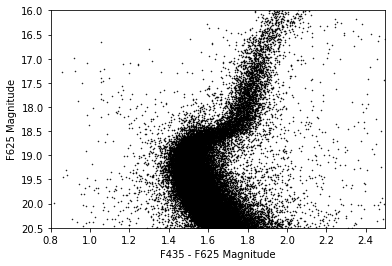

In [63]:
#Create CMD
x1 = []

for i in range(len(m435)):
    x1.append(m435[i] - m625[i])
    
plt.plot(x1, m625, 'k.', markersize = 1)
plt.gca().invert_yaxis()
plt.xlim(0.8,2.5)
plt.ylim(20.5,16)
plt.ylabel('F625 Magnitude')
plt.xlabel('F435 - F625 Magnitude')

#plt.plot(m435 - m625, m625)

Text(0.5, 0, 'F658 - F625 Magnitude')

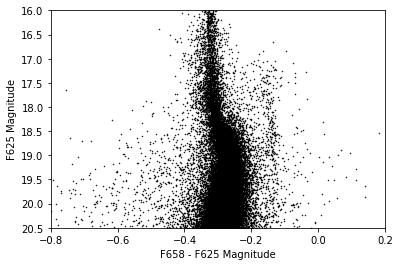

In [64]:
x2 = []

for i in range(len(m658)):
    x2.append(m658[i]- m625[i])
    
plt.plot(x2, m625, 'k.',markersize = 1)
plt.gca().invert_yaxis()
plt.xlim(-0.8,0.2)
plt.ylim(20.5,16)

plt.ylabel('F625 Magnitude')
plt.xlabel('F658 - F625 Magnitude')

In [65]:
print(len(X))
print(max(X))

130952
4212.41


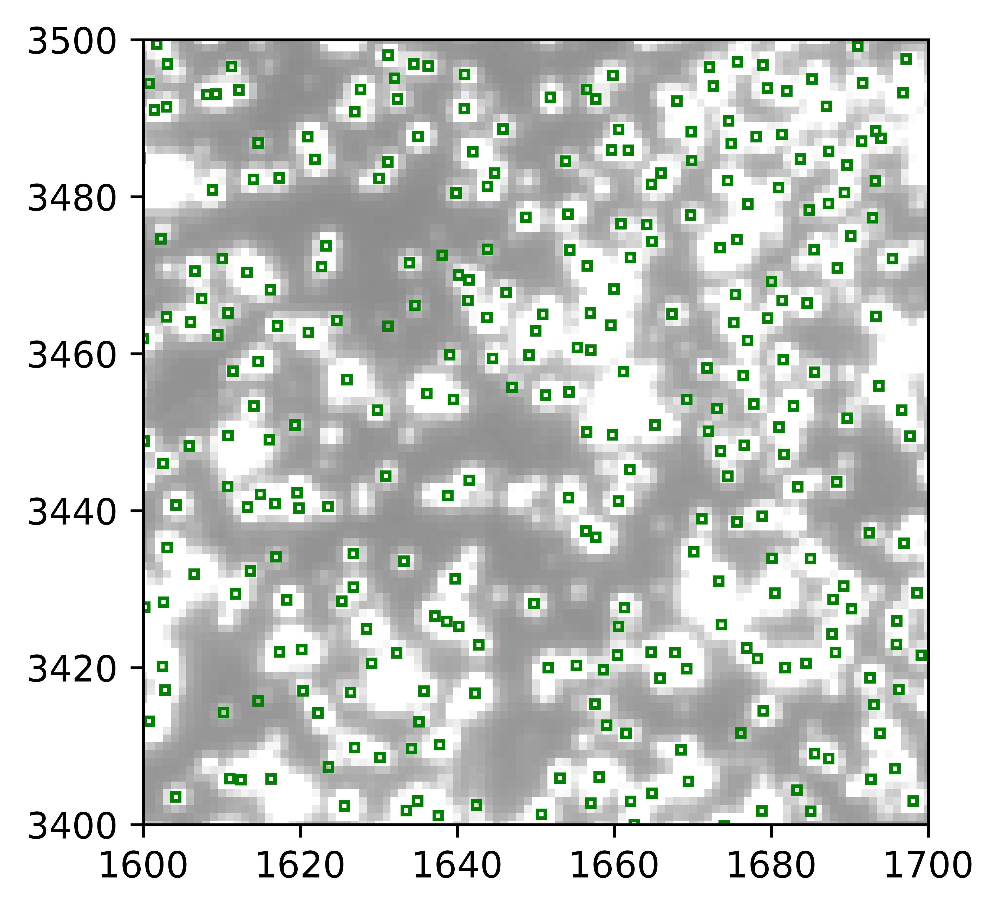

In [66]:
def scale_plot_size(factor=10):
    default_dpi = plt.rcParamsDefault['figure.dpi']
    plt.rcParams['figure.dpi'] = default_dpi*factor
    plt.rcParams['agg.path.chunksize'] = 1000

scale_plot_size(10)

xMin = 1600
xMax = 1700
yMin = 3400
yMax = 3500
    
hdu = fits.open("/home/slegeza/DolPhot/images/j92103040_drz.chip1.fits")[0] #3040_drz.chip1.fits is what I've been using so far
#filename = get_pkg_data_filename('/home/slegeza/DolPhot/images/j92103040_drz.chip1.fits')
#hdu = fits.open("/home/slegeza/DolPhot/images/j92103011_drz.chip1.fits")[0]

wcs = WCS(hdu.header)
#hdu.info()
image_data = hdu.data

#Calculate RA & dec of each detected star
for i in range(len(X)):
    #print('test pixel coords =', X[1000], Y[1000])
    imgCoords = [X[i], Y[i]]
    sky = wcs.pixel_to_world(imgCoords[0], imgCoords[1])

    #print('sky RA = ', sky.ra)
    #print('sky DEC = ', sky.dec)

    #pixel = wcs.world_to_pixel_values(sky.ra, sky.dec)
    #print('calculated pixel coords = ', pixel[0], pixel[1])
    RA.append(sky.ra)
    DEC.append(sky.dec)

#plt.subplot()
#plt.imshow(hdu.data, origin = 'lower', cmap = 'gray')
#plt.show()
plotData = image_data[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()


#ax = plt.subplot(projection=wcs)

ax.imshow(image_data, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray')
ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

#ax.add_axes([1, 1, 1, 1], projection=wcs)

#ax.set_autoscale_on(False)




for i in range(len(xPos)):

    
    if (xPos[i] > xMin and xPos[i] < xMax and yPos[i] > yMin and yPos[i] < yMax):
        ''
        #print(X[i]-xMin, Y[i]-yMin)
        r = Rectangle((xPos[i]-1, yPos[i]-1), 1, 1, edgecolor = 'red', facecolor = 'none')#, transform = ax.get_transform('pixel'))
        #ax.add_patch(r)
        
for i in range(len(X)):
    if (X[i] > xMin and X[i] < xMax and Y[i] > yMin and Y[i] < yMax):
    
    #print(X[i]-xMin, Y[i]-yMin)
        r = Rectangle((X[i]-1, Y[i]-1), 1, 1, edgecolor = 'green', facecolor = 'none')#, transform = ax.get_transform('pixel'))
        ax.add_patch(r)
        

#r = Rectangle((25, 5), 0, 1, edgecolor = 'green', facecolor = 'none')#, transform = ax.get_transform(wcs))
#ax.add_patch(r)


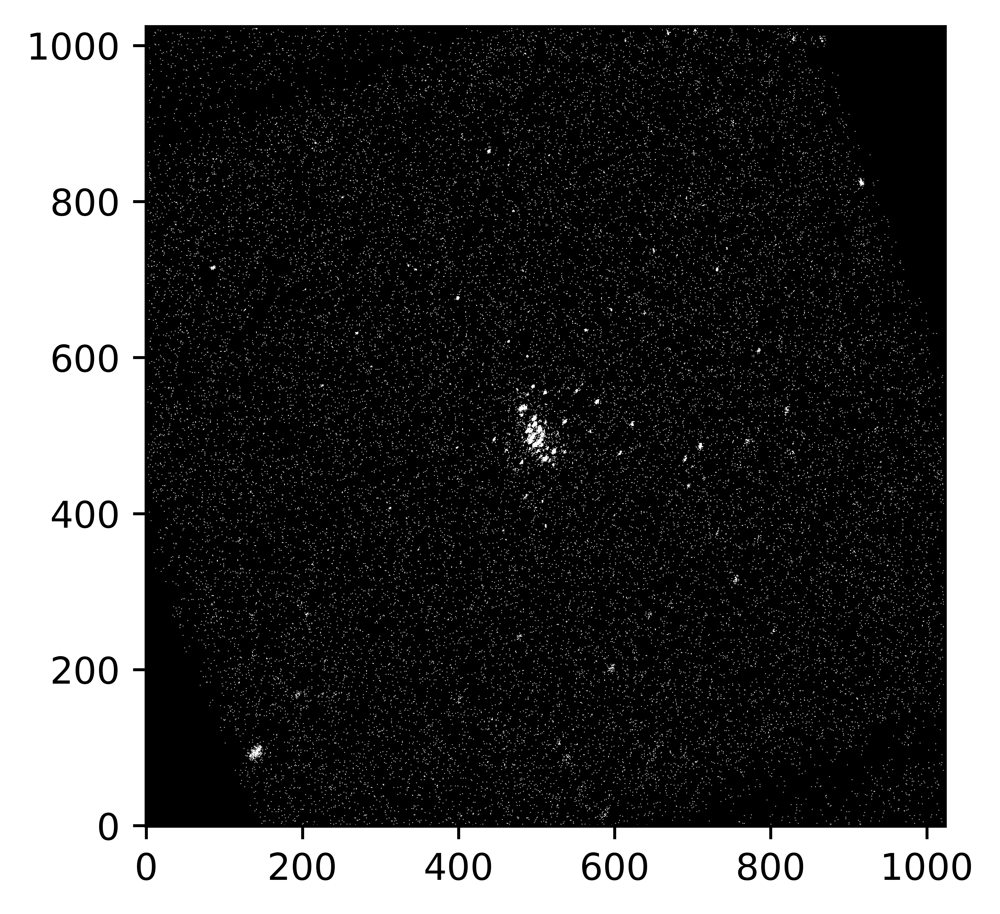

In [67]:
def scale_plot_size(factor=10):
    default_dpi = plt.rcParamsDefault['figure.dpi']
    plt.rcParams['figure.dpi'] = default_dpi*factor
    plt.rcParams['agg.path.chunksize'] = 1000

scale_plot_size(10)

chandra = fits.open("/home/slegeza/DolPhot/Chandra/primary/acisf02677N004_cntr_img2.fits")[0] #3040_drz.chip1.fits is what I've been using so far
#filename = get_pkg_data_filename('/home/slegeza/DolPhot/images/j92103040_drz.chip1.fits')
#hdu = fits.open("/home/slegeza/DolPhot/images/j92103011_drz.chip1.fits")[0]

wcsChandra = WCS(chandra.header)
#hdu.info()
#print(wcs)

pixelChandra = wcsChandra.world_to_pixel_values(RA[0], DEC[0])
#print(pixelChandra)

image_dataChandra = chandra.data

#plt.subplot()
#plt.imshow(hdu.data, origin = 'lower', cmap = 'gray')
#plt.show()
#plotData = image_dataChandra[xMin:xMax, yMin:yMax]

figChandra, axChandra = plt.subplots()


#ax = plt.subplot(projection=wcs)

axChandra.imshow(image_dataChandra, origin = 'lower', vmin= 0, vmax = 1, cmap = 'gray')


#ax.add_axes([1, 1, 1, 1], projection=wcs)

#ax.set_autoscale_on(False)



#for i in range(len(xPos)):
#    if (xPos[i] > xMin and xPos[i] < xMax and yPos[i] > yMin and yPos[i] < yMax):
        #''
        #print(X[i]-xMin, Y[i]-yMin)
#       r = Rectangle((xPos[i]-1, yPos[i]-1), 1, 1, edgecolor = 'red', facecolor = 'none')#, transform = ax.get_transform('pixel'))
        #ax.add_patch(r)
    
#pixelChandraX = []
#pixelChandraY = []
        
#for i in range(len(X)):
    #print(X[i]-xMin, Y[i]-yMin)
    
#    pixelChandraX.append(wcsChandra.world_to_pixel_values(RA[i], DEC[i])[0])
#    pixelChandraY.append(wcsChandra.world_to_pixel_values(RA[i], DEC[i])[1])
#    
#    r = Rectangle((pixelChandraX[i], pixelChandraY[i]), 1, 1, edgecolor = 'green', facecolor = 'none')
#    axChandra.add_patch(r)

In [68]:
#Import Chandra data
sep, chandraRAh, chandraRAm, chandraRAs, chandraDECd, chandraDECm, chandraDECs, err, sigma = np.loadtxt('chandra.txt', unpack=True)

chandraRA = [] #chandra sources RA
chandraDEC = [] #chandra sources DEC

for i in range(len(chandraRAh)):
    
    chandraRAdeg = chandraRAh[i]
    chandraRA.append(str(int(chandraRAdeg))+'h'+str(int(chandraRAm[i]))+'m'+str(chandraRAs[i])+'s')
    
    chandraDEC.append(str(int(chandraDECd[i]))+'d'+str(int(chandraDECm[i]))+'m'+str(chandraDECs[i])+'s')
    print(chandraRA[i], chandraDEC[i])
#print(chandraRA[0])
#print(chandraDEC[0])



17h1m12.58s -30d6m41.33s
17h1m12.85s -30d6m45.66s
17h1m12.7s -30d6m48.89s
17h1m13.11s -30d6m42.34s
17h1m13.11s -30d6m38.7s
17h1m12.88s -30d6m53.63s
17h1m13.36s -30d6m43.14s
17h1m13.22s -30d6m50.64s
17h1m13.38s -30d6m45.95s
17h1m12.76s -30d6m55.64s
17h1m13.1s -30d6m55.42s
17h1m12.48s -30d6m57.27s
17h1m13.33s -30d6m53.39s
17h1m11.63s -30d6m40.83s
17h1m12.93s -30d6m59.21s
17h1m12.16s -30d6m59.55s
17h1m13.73s -30d6m36.92s
17h1m13.34s -30d6m57.89s
17h1m13.53s -30d6m31.98s
17h1m12.79s -30d7m2.61s
17h1m13.76s -30d6m32.49s
17h1m12.56s -30d7m4.04s
17h1m11.65s -30d6m59.9s
17h1m12.38s -30d7m5.45s
17h1m12.59s -30d6m22.39s
17h1m13.45s -30d6m23.71s
17h1m12.2s -30d7m8.25s
17h1m13.73s -30d7m6.53s
17h1m13.17s -30d6m18.63s
17h1m14.47s -30d6m58.87s
17h1m10.41s -30d6m47.19s
17h1m13.96s -30d6m20.56s
17h1m11.06s -30d6m21.48s
17h1m15.07s -30d6m51.98s
17h1m10.07s -30d6m28.27s
17h1m13.54s -30d7m27.98s
17h1m13.46s -30d5m59.45s
17h1m12.74s -30d7m31.21s
17h1m8.94s -30d7m0.45s
17h1m8.36s -30d6m42.15s
17h1m16.87s -

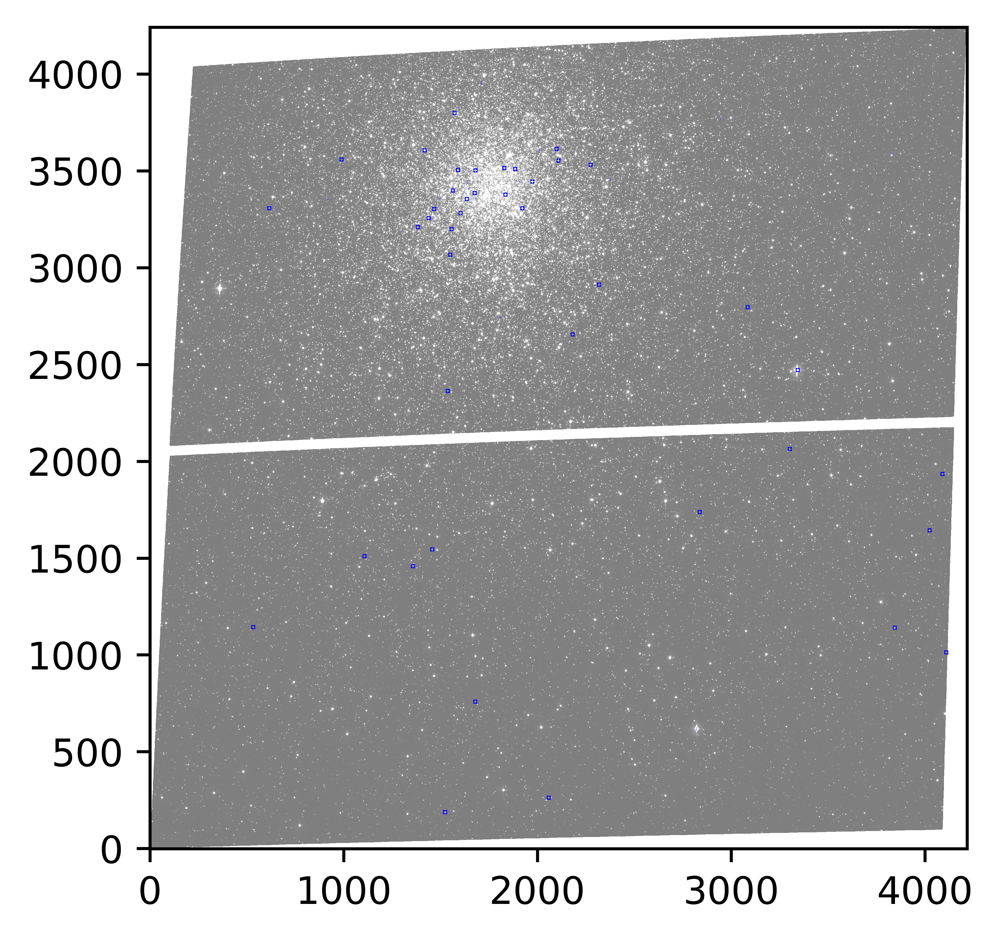

In [75]:
def scale_plot_size(factor=10):
    default_dpi = plt.rcParamsDefault['figure.dpi']
    plt.rcParams['figure.dpi'] = default_dpi*factor
    plt.rcParams['agg.path.chunksize'] = 1000

scale_plot_size(10)

xMin = 1800
xMax = 1900
yMin = 3100
yMax = 3200
    
hdu = fits.open("/home/slegeza/DolPhot/images/j92103040_drz.chip1.fits")[0] #3040_drz.chip1.fits is what I've been using so far
#filename = get_pkg_data_filename('/home/slegeza/DolPhot/images/j92103040_drz.chip1.fits')
#hdu = fits.open("/home/slegeza/DolPhot/images/j92103011_drz.chip1.fits")[0]

wcs = WCS(hdu.header)
#hdu.info()
image_data = hdu.data

#plt.subplot()
#plt.imshow(hdu.data, origin = 'lower', cmap = 'gray')
#plt.show()
plotData = image_data[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()


#ax = plt.subplot(projection=wcs)

ax.imshow(image_data, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray')

#print(chandraRA[0], chandraDEC[0])
#pos = SkyCoord(chandraRA[0], chandraDEC[0], frame='icrs')
#print(pos.ra, pos.dec)
#test = wcs.world_to_pixel_values(pos.ra, pos.dec)
#print(test[0], test[1])
#ax.add_axes([1, 1, 1, 1], projection=wcs)

#ax.set_autoscale_on(False)

for i in range(len(chandraRA)):
    
    #Convert from RA & DEC to pixels
    pos = SkyCoord(chandraRA[i], chandraDEC[i], frame='icrs')
    pixel = wcs.world_to_pixel_values(pos.ra, pos.dec)
        
    r = Rectangle((pixel[0]-1, pixel[1]-1), 1, 1, edgecolor = 'blue', facecolor = 'none')#, transform = ax.get_transform('pixel'))
    ax.add_patch(r)
    #print(pos.ra, pos.dec)


#r = Rectangle((25, 5), 0, 1, edgecolor = 'green', facecolor = 'none')#, transform = ax.get_transform(wcs))
#ax.add_patch(r)

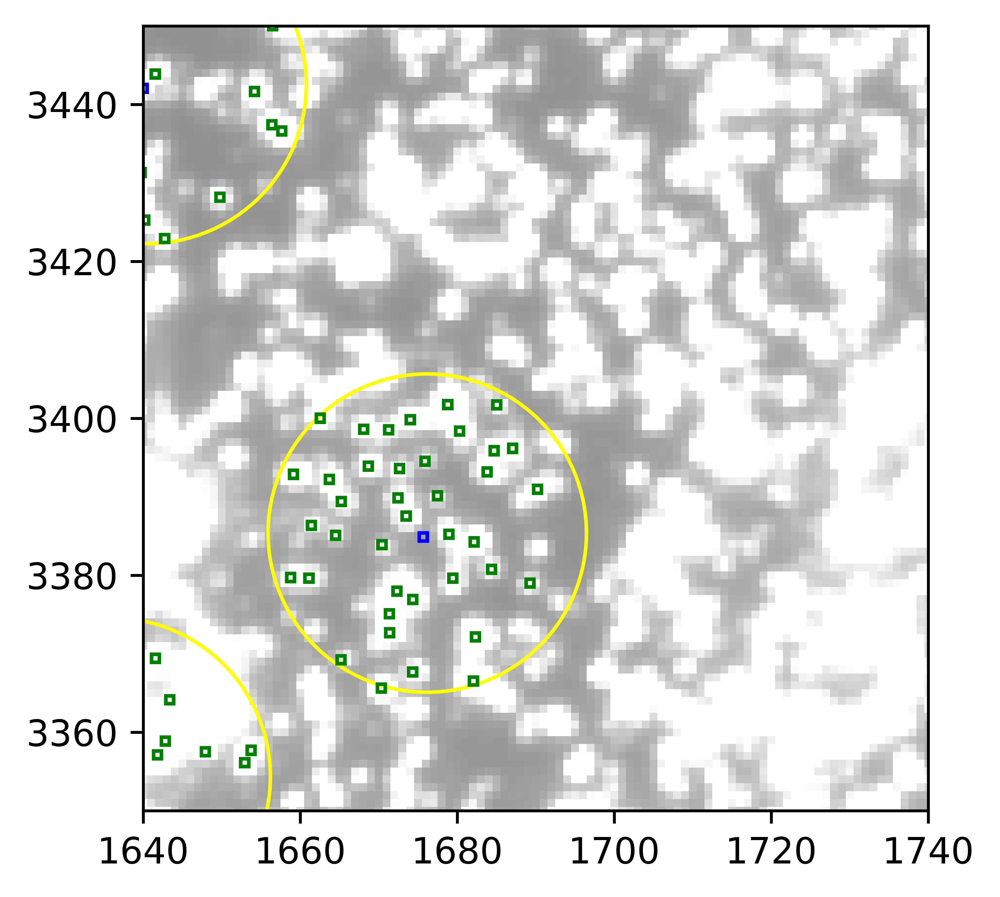

In [81]:
def scale_plot_size(factor=10):
    default_dpi = plt.rcParamsDefault['figure.dpi']
    plt.rcParams['figure.dpi'] = default_dpi*factor
    plt.rcParams['agg.path.chunksize'] = 1000

scale_plot_size(10)

#Adjust these to inspect different regions
xMin = 1640
xMax = 1740
yMin = 3350
yMax = 3450
    
hdu = fits.open("/home/slegeza/DolPhot/images/j92103040_drz.chip1.fits")[0] 
wcs = WCS(hdu.header)
image_data = hdu.data
plotData = image_data[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()
ax.imshow(image_data, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray')
ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

for i in range(len(chandraRA)):
    
    #Convert from RA & DEC to pixels
    pos = SkyCoord(chandraRA[i], chandraDEC[i], frame='icrs')
    pixel = wcs.world_to_pixel_values(pos.ra, pos.dec)
        
    #Add blue rectangle on x-ray source
    r = Rectangle((pixel[0]-1, pixel[1]-1), 1, 1, edgecolor = 'blue', facecolor = 'none')#, transform = ax.get_transform('pixel'))
    ax.add_patch(r)

    
    #Create circle subtending 1' around detected stars
    #ACS image is 4096 x 4096 pixels or 202 x 202 arcseconds so 1' = 20.28 pixels
    
    #ax.scatter(pixel[0]-0.5, pixel[1]-0.5, s = 20.28, edgecolor = 'yellow', facecolor = 'none')
    c = Circle((pixel[0], pixel[1]), 20.28, edgecolor='yellow', facecolor='none')
    ax.add_patch(c)
    
    #Highlight all identified dolphot stars within the yellow circle
    for j in range(len(X)):
        if (((X[j] - pixel[0])**2+(Y[j] - pixel[1])**2))**(1/2) <= 20.28:
            r2 = Rectangle((X[j]-1,Y[j]-1), 1, 1, edgecolor = 'green', facecolor = 'none')
            ax.add_patch(r2)

    



In [ ]:
#Import chandra data for M92

#Import Chandra data
sep, chandraRAh, chandraRAm, chandraRAs, chandraDECd, chandraDECm, chandraDECs, err, sigma = np.loadtxt('M92/chandraM92.txt', unpack=True)

chandraRAM92 = [] #chandra sources RA
chandraDECM92 = [] #chandra sources DEC

for i in range(len(sep)):
    
    chandraRAdeg = chandraRAh[i]
    chandraRAM92.append(str(int(chandraRAdeg))+'h'+str(int(chandraRAm[i]))+'m'+str(chandraRAs[i])+'s')
    
    chandraDECM92.append(str(int(chandraDECd[i]))+'d'+str(int(chandraDECm[i]))+'m'+str(chandraDECs[i])+'s')
    
print(chandraRAM92[0])
print(chandraDECM92[0])



In [ ]:
#Use M92 Hubble & Chandra data to confirm if these are using the same coordinate frame
#Compare against Lu et al. 2011

def scale_plot_size(factor=10):
    default_dpi = plt.rcParamsDefault['figure.dpi']
    plt.rcParams['figure.dpi'] = default_dpi*factor
    plt.rcParams['agg.path.chunksize'] = 1000

scale_plot_size(10)

#Adjust these to inspect different regions
xMin = 2050
xMax = 2150
yMin = 3350
yMax = 3450
    
hdu = fits.open("/home/slegeza/DolPhot/M92/j92104s3q_drz.chip1.fits")[0] 
wcs = WCS(hdu.header)
image_data = hdu.data
#plotData = image_data[xMin:xMax, yMin:yMax]

fig, ax = plt.subplots()
print(hdu)
ax.imshow(image_data, origin = 'lower', vmin= -5e3, vmax = 5e3, cmap = 'gray')
ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

for i in range(len(chandraRAM92)):
    
    #Convert from RA & DEC to pixels
    pos = SkyCoord(chandraRAM92[i], chandraDECM92[i], frame='icrs')
    pixel = wcs.world_to_pixel_values(pos.ra, pos.dec)
        
    #Add blue rectangle on x-ray source
    r = Rectangle((pixel[0]-1, pixel[1]-1), 1, 1, edgecolor = 'blue', facecolor = 'none')#, transform = ax.get_transform('pixel'))
    ax.add_patch(r)

    
    #Create circle subtending 1' around detected stars
    #ACS image is 4096 x 4096 pixels or 202 x 202 arcseconds so 1' = 20.28 pixels
    
    #ax.scatter(pixel[0]-0.5, pixel[1]-0.5, s = 20.28, edgecolor = 'yellow', facecolor = 'none')
    c = Circle((pixel[0], pixel[1]), 20.28, edgecolor='yellow', facecolor='none')
    ax.add_patch(c)
    
    #Highlight all identified dolphot stars within the yellow circle
    #for j in range(len(X)):
    #    if (((X[j] - pixel[0])**2+(Y[j] - pixel[1])**2))**(1/2) <= 20.28:
    #        r2 = Rectangle((X[j]-1,Y[j]-1), 1, 1, edgecolor = 'green', facecolor = 'none')
    #        ax.add_patch(r2)

